
# **Advanced Lane Finding Project**

## Thomas Smith
---


## Pipeline

* Compute camera calibration and distortion coefficients.
* Load image or video frame.
* Undistort the raw image.
* Create a thresholded binary image using color and gradient thresholds.
* Transform perspective of binary image to "birds-eye view".
  * Note: Try swapping the thresholding and transforming stages around
* Identify lane pixels and fit lines to identify lanes.
* Determine lane curvature and position.
* Output final image with lane boundaries warped onto original image and lane curvature and position

---

Import useful modules:

In [1]:
import os
import fnmatch
import cv2
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets


---
Helper functions:

In [115]:
def bgr2rgb(img):
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return rgb

def bgr2gray(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    return gray

def rgb2gray(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    return gray

def gray2bgr(img):
    bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    return bgr

def bgr2hls(img):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    return hls

def get_sobel(img, orient='x', k_size=3):
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=k_size)
    elif orient == 'y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = k_size)
    else:
        print('Orientation must be "x" or "y"')
        
    return sobel

def sobel_abs_thresh(img, orient='x', k_size=3, threshold=(0,255)):
    sobel = get_sobel(img, orient, k_size)
    abs_sobel = np.absolute(sobel)
    thresh_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    mask = cv2.inRange(thresh_sobel, threshold[0], threshold[1])
    
    return mask

def sobel_mag_thresh(img, k_size=3, threshold=(0,255)):
    sobelx = get_sobel(img, 'x', k_size)
    sobely = get_sobel(img, 'y', k_size)
    sobel_mag = np.sqrt(sobelx**2 + sobely**2)
    sobel_mag_abs = np.uint8(255*sobel_mag/np.max(sobel_mag))
    mask = cv2.inRange(sobel_mag_abs, threshold[0], threshold[1])
    
    return mask

def sobel_dir_thresh(img, k_size=3, threshold=(0,np.pi/2)):
    sobelx = get_sobel(img, 'x', k_size)
    sobely = get_sobel(img, 'y', k_size)
    abs_sobelx = np.absolute(sobelx)    
    abs_sobely = np.absolute(sobely)
    sobel_dir = np.arctan2(abs_sobely, abs_sobelx)
    mask = cv2.inRange(sobel_dir, threshold[0], threshold[1])
    
    return mask


---
## Camera calibration
In this step of the pipeline we find the camera calibration matrix and distortion coefficients using the 20 chessboard images supplied in camera_cal.

See [OpenCV: Camera Calibration](https://docs.opencv.org/master/dc/dbb/tutorial_py_calibration.html) for a good tutorial used to develop this stage of the pipeline

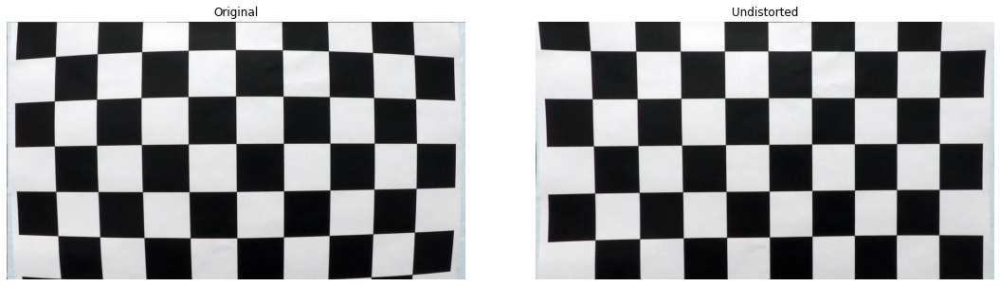

In [652]:
def calCam(path, nx, ny):
    obj_pts = []    # Coordinate points in real world (3D)
    img_pts = []    # Coordinate points in image space (2D)

    objp = [([x,y,0]) for y in range(ny) for x in range(nx)]
    objp = np.asarray(objp, np.float32)
    cal_images = fnmatch.filter(os.listdir(path), '*.jpg')

    for cal_image in cal_images:
        img = cv2.imread(os.path.join(cal_path, cal_image))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if ret:
            obj_pts.append(objp)            
            img_pts.append(corners)
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pts, img_pts, gray.shape[::-1], None, None)
    newCameraMtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, gray.shape[::-1], 0)   
    # Using newCameraMtx (with alpha = 0) in place of mtx when undistorting images 
    # removes empty regions of undistorted images
        
    return mtx, dist, newCameraMtx

cal_path = "camera_cal"

nx = 9
ny = 6

mtx, dist, newCameraMtx = calCam(cal_path, nx, ny)

img = cv2.imread(os.path.join(cal_path, 'calibration1.jpg'))
undist = cv2.undistort(img, mtx, dist, None, newCameraMtx)
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('Original')
plt.axis('Off')
plt.imshow(img)
plt.subplot(122)
plt.title('Undistorted')
plt.axis('Off')
plt.imshow(undist)
plt.subplots_adjust(wspace = 0.)


---
## Undistort Image
Images are undistorted using the calibration matrix and distortion coefficients determined in the previous step.

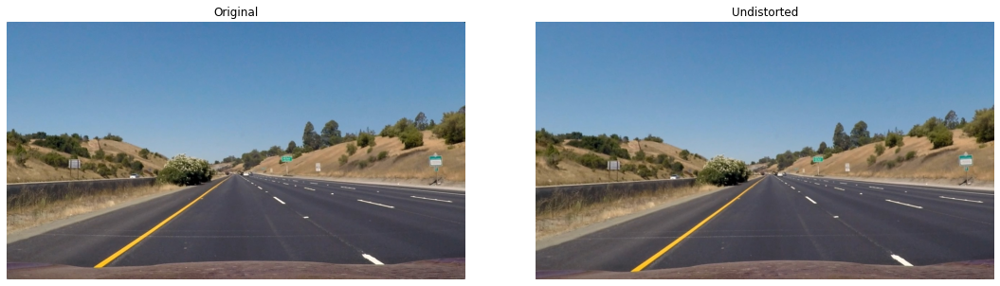

In [106]:
path = 'test_images'
fn = 'straight_lines1.jpg'
img_bgr = cv2.imread(os.path.join(path, fn))

img_undist = cv2.undistort(img_bgr, mtx, dist, None, newCameraMtx)

plt.figure(figsize = (20,5))
plt.subplot(121)
plt.title('Original')
plt.axis('Off')
plt.imshow(bgr2rgb(img_bgr));
plt.subplot(122)
plt.title('Undistorted')
plt.axis('Off')
plt.subplots_adjust(wspace = 0)
plt.imshow(bgr2rgb(img_undist));

---
## Create Threshold Image
Use a combination of gradient and color thresholds to produce a binary threshold image of the undistorted image. 

### Gradient Thresholds
The following gradient thresholds are applied to identify pixels that correspond to lane lines:
 - Absolute gradient in x and y
 - Magnitude of the gradient
 - Direction of the gradient
 
Gradients are computed using the Sobel function.

### Color Thresholds
The following color thresholds are applied to identify pixels that correspond to lane lines:
 - S-channel in HLS color space
 - H-channel in HLS color space
 - R-channel in RGB color space

---
#### Absolute Gradient in X and Y

Threshold values are applied separately to the absolute value of the gradients in x and y.

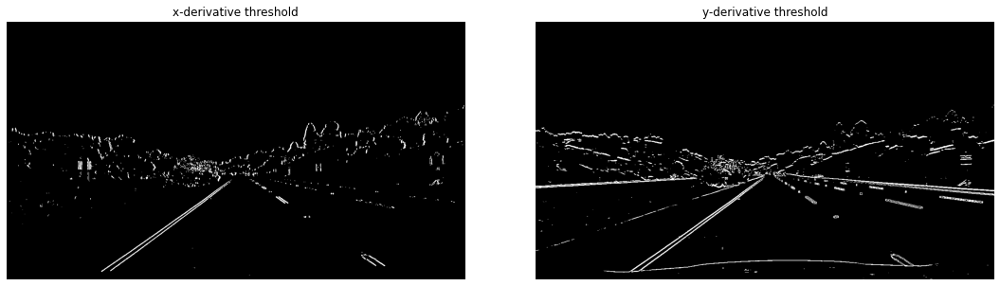

In [5]:
img_undist_gray = bgr2gray(img_undist)

k_size = 5
thresh = (50, 180)
sobelx = sobel_abs_thresh(img_undist_gray,'x', k_size, thresh)
sobely = sobel_abs_thresh(img_undist_gray,'y', k_size, thresh)

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('x-derivative threshold')
plt.axis('off')
plt.imshow(sobelx, cmap='gray');
plt.subplot(122)
plt.title('y-derivative threshold')
plt.axis('off')
plt.imshow(sobely, cmap='gray');
plt.subplots_adjust(wspace = 0)

This class runs the Sobel function on an image and allows the user to vary the parameters interactively

In [6]:
class GradientThreshold:
    def __init__(self, img, k_size, thresh=(10,240), orient='x'): 
        self.img = img
        self.k_size = k_size
        self.thresh_lo = thresh[0]
        self.thresh_hi = thresh[1]
        self.thresh = thresh      
        self.orient = orient
        self.output = widgets.Output(layout = {
            'width': '100%',
            'height': '550px',
        })
        style = {'description_width': '90px'}
        layout = widgets.Layout(width = '100%', height = '100%')

        self.k_size_tb = widgets.IntSlider(min=1, max=21, step=2, value=self.k_size,
                        description='Kernel size', style=style, layout=layout)
        self.thresh_lo_tb = widgets.IntSlider(min=0, max =255, value=self.thresh_lo,
                        description='Low threshold', style=style, layout=layout)
        self.thresh_hi_tb = widgets.IntSlider(min=0, max=255, value=self.thresh_hi, 
                        description='High threshold', style=style, layout=layout)

        self.k_size_tb.observe(self.k_size_eventhandler, 'value')        
        self.thresh_lo_tb.observe(self.thresh_lo_eventhandler, 'value')
        self.thresh_hi_tb.observe(self.thresh_hi_eventhandler, 'value')
        
        display(self.k_size_tb)
        display(self.thresh_lo_tb)
        display(self.thresh_hi_tb)
        self.render()
        plt.close("all")

    def render(self):
        self.thresh = (self.thresh_lo, self.thresh_hi)
        self.sobel = sobel_abs_thresh(self.img, self.orient, self.k_size, self.thresh)
        with self.output:
            self.output.clear_output(wait=True)
            fig, ax = plt.subplots(figsize = (12.8*1.2, 9.6*1.2));
            ax.axis('off')
            plt.title('{}-gradient threshold'.format(self.orient))
            ax.imshow(self.sobel, cmap='gray')
            display(fig)

    def k_size_eventhandler(self, change):
        self.k_size = change.new
        self.render()

    def thresh_lo_eventhandler(self, change):
        if self.thresh_hi >= change.new:
            self.thresh_lo = change.new
        else:
            self.thresh_lo = self.thresh_hi
        self.render()

    def thresh_hi_eventhandler(self, change):
        if self.thresh_lo <= change.new:
            self.thresh_hi = change.new
        else:
            self.thresh_hi = self.thresh_lo
        self.render()

In [7]:
sobelx_mask = GradientThreshold(img_undist_gray, 3, (50,180), 'x')
display(sobelx_mask.output)

IntSlider(value=3, description='Kernel size', layout=Layout(height='100%', width='100%'), max=21, min=1, step=…

IntSlider(value=50, description='Low threshold', layout=Layout(height='100%', width='100%'), max=255, style=Sl…

IntSlider(value=180, description='High threshold', layout=Layout(height='100%', width='100%'), max=255, style=…

Output(layout=Layout(height='550px', width='100%'))

In [8]:
sobely_mask = GradientThreshold(img_undist_gray, 3, (50, 180), 'y')
display(sobely_mask.output)

IntSlider(value=3, description='Kernel size', layout=Layout(height='100%', width='100%'), max=21, min=1, step=…

IntSlider(value=50, description='Low threshold', layout=Layout(height='100%', width='100%'), max=255, style=Sl…

IntSlider(value=180, description='High threshold', layout=Layout(height='100%', width='100%'), max=255, style=…

Output(layout=Layout(height='550px', width='100%'))

Sobel x: k = 7, 50, 180

Sobel y: k, lo, hi = 7, 40, 180

Next we combine the x and y gradient threshold images in both AND and OR to identify the best combination.

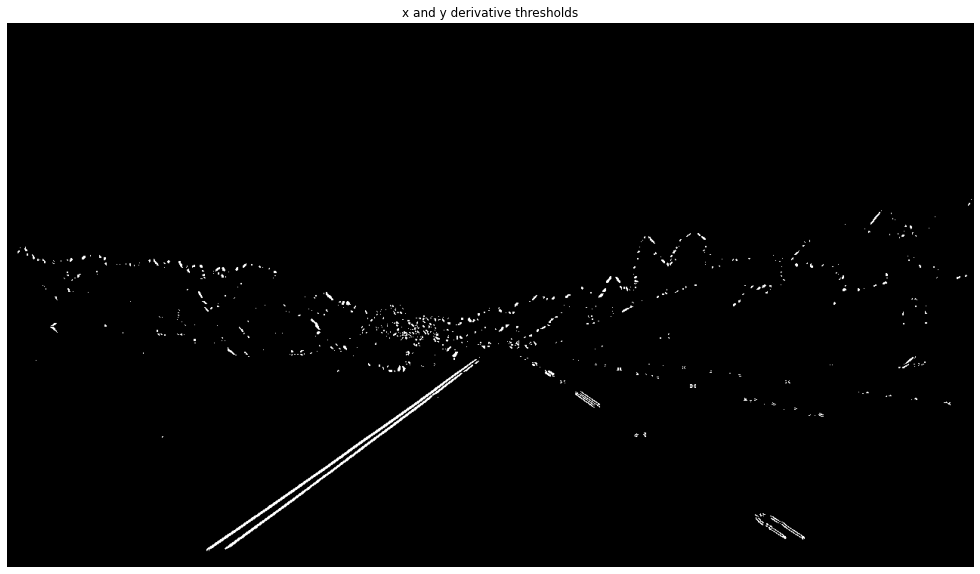

In [32]:
sobelxandy_mask = sobelx_mask.sobel & sobely_mask.sobel
plt.figure(figsize=(20,10))
plt.title('x and y derivative thresholds')
plt.axis('off')
plt.imshow(sobelxandy_mask, cmap='gray');

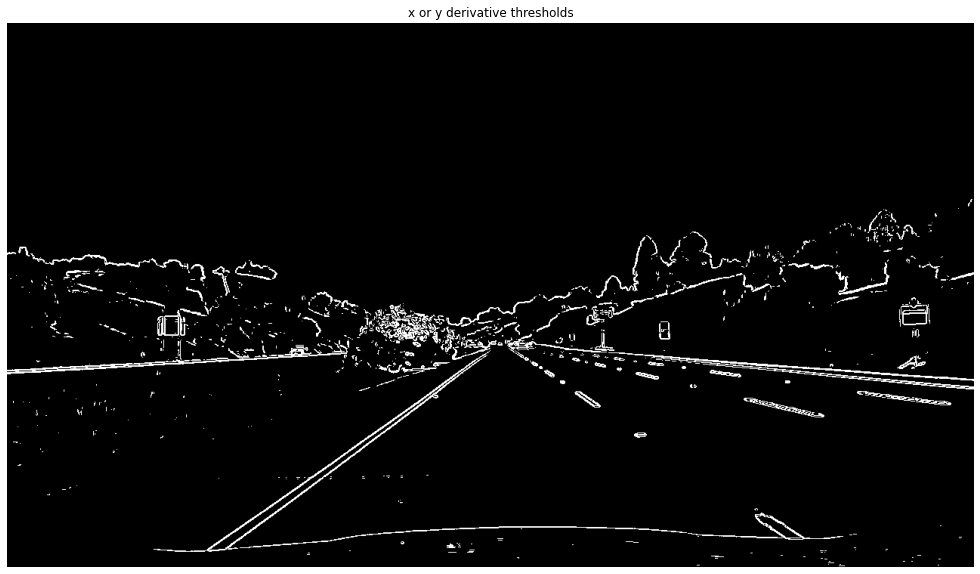

In [10]:
sobelxory_mask = sobelx_mask.sobel | sobely_mask.sobel
plt.figure(figsize=(20,10))
plt.title('x or y derivative thresholds')
plt.axis('off')
plt.imshow(sobelxory_mask, cmap='gray');

---
#### Gradient Magnitude

Threshold values are applied to the magnitude of the gradient, found by:

$$sobel_{xy} = \sqrt{sobel_x^2 + sobel_y^2}$$

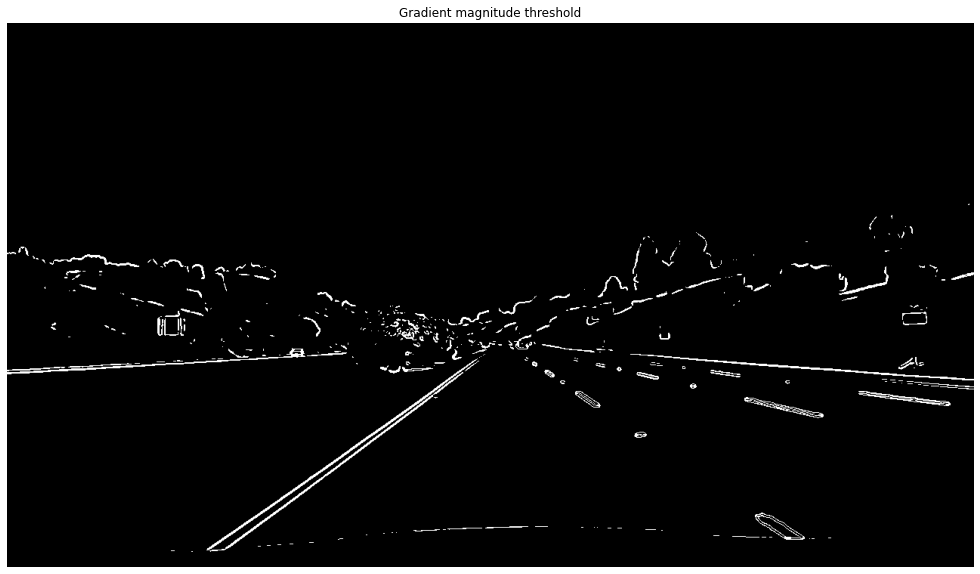

In [33]:
k_size = 7
thresh = (80, 180)
sobel_mag_mask = sobel_mag_thresh(img_undist_gray, k_size, thresh)
plt.figure(figsize = (20,10))
plt.title('Gradient magnitude threshold')
plt.axis('off')
plt.imshow(sobel_mag_mask, cmap='gray');

---
#### Gradient Direction

Threshold values are applied to the direction of the gradient, found by: 
$$\arctan\left(\frac{sobel_y}{sobel_x}\right)$$

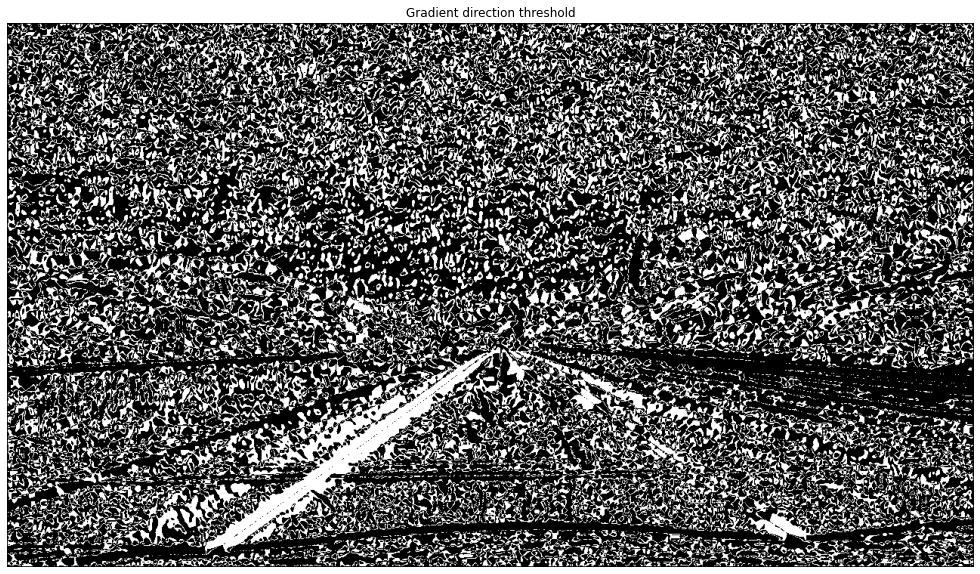

In [34]:
k_size = 23
thresh = (0.7, 1.2)
sobel_dir_mask = sobel_dir_thresh(img_undist_gray, k_size, thresh)
plt.figure(figsize = (20,10))
plt.title('Gradient direction threshold')
plt.axis('off')
plt.imshow(sobel_dir_mask, cmap='gray');

---
#### Combined Gradient Thresholds

Gradients threshold masks are combined using a combination of AND & OR operations to generate an overall gradient threshold mask.

A variety of combinations are shown below to aid identification of the best combination.

The two most promising combinations are:

**(X & Y) | (MAG & DIR)**

**(X | Y) & (MAG | DIR)**

Both these combinations will be combined with color thresholds to see which performs best.

In [35]:
grad_thresh_1 = (sobelx_mask.sobel & sobely_mask.sobel) | (sobel_mag_mask & sobel_dir_mask)
color_binary = np.dstack(((sobelx_mask.sobel & sobely_mask.sobel), sobel_mag_mask, sobel_dir_mask))
grad_thresh_2 = (sobelx_mask.sobel | sobely_mask.sobel) & (sobel_mag_mask | sobel_dir_mask)
color_binary = np.dstack(((sobelx_mask.sobel & sobely_mask.sobel), sobel_mag_mask, sobel_dir_mask))

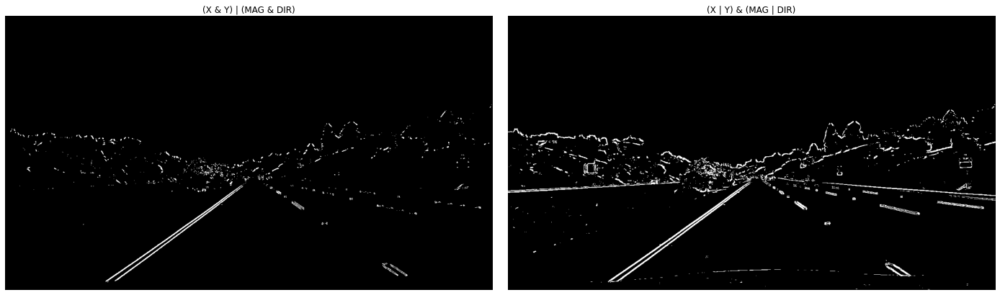

In [36]:
plt.figure(figsize = (25,7))
plt.subplot(121)
plt.axis('off')
plt.title('(X & Y) | (MAG & DIR)')
plt.imshow(grad_thresh_1, cmap='gray');
plt.subplot(122)
plt.axis('off')
plt.title('(X | Y) & (MAG | DIR)')
plt.imshow(grad_thresh_2, cmap='gray');
plt.subplots_adjust(wspace = 0)

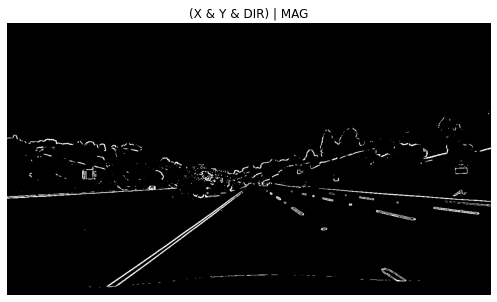

In [37]:
grad_thresh_5 = (sobelx_mask.sobel & sobely_mask.sobel & sobel_dir_mask) | (sobel_mag_mask)
plt.figure(figsize = (10,5))
plt.title('(X & Y & DIR) | MAG')
plt.axis('off')
plt.imshow(grad_thresh_5, cmap='gray');

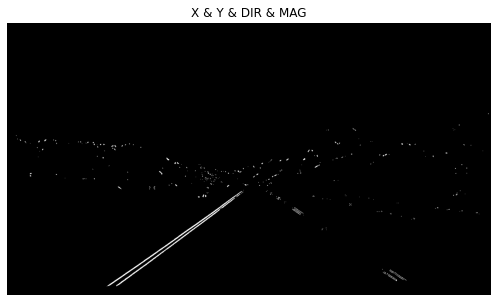

In [38]:
grad_thresh_3 = (sobelx_mask.sobel & sobely_mask.sobel & sobel_dir_mask & sobel_mag_mask)
plt.figure(figsize = (10,5))
plt.title('X & Y & DIR & MAG')
plt.axis('off')
plt.imshow(grad_thresh_3, cmap='gray');

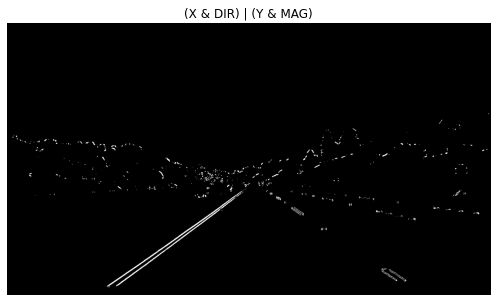

In [39]:
grad_thresh_4 = (sobelx_mask.sobel | sobel_dir_mask) & (sobely_mask.sobel & sobel_mag_mask)
plt.figure(figsize = (10,5))
plt.title('(X & DIR) | (Y & MAG)')
plt.axis('off')
plt.imshow(grad_thresh_4, cmap='gray');

---
### Color thresholds
First we show the image in R, G, B channels and H, L, S channels to identify channels which highlight lane lines the best

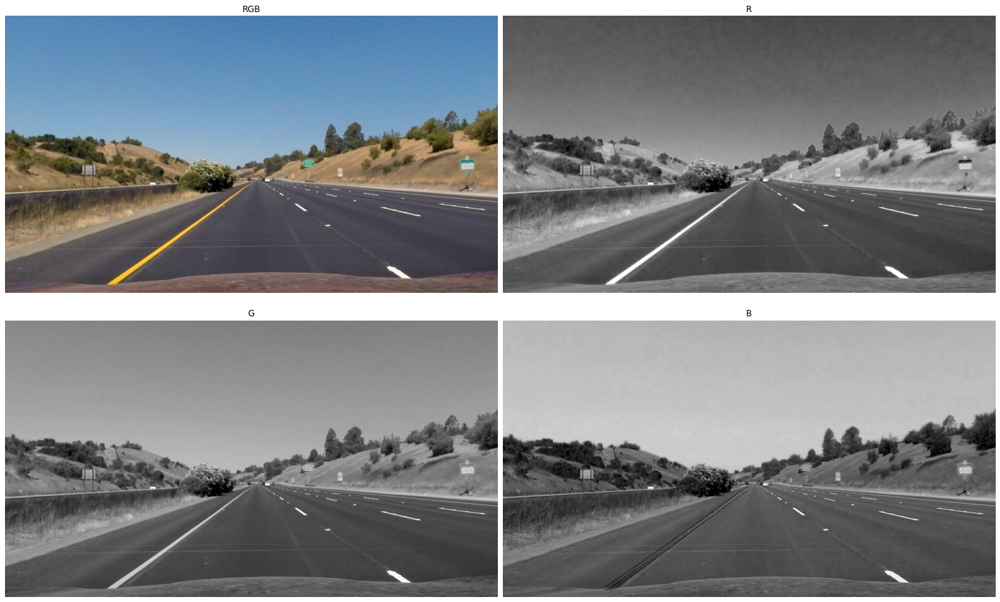

In [40]:
img_rgb = bgr2rgb(img_undist)
r = img_rgb[:,:,0]
g = img_rgb[:,:,1]
b = img_rgb[:,:,2]
fig, axs = plt.subplots(2, 2, figsize=(25,15))
axs[0,0].set_title('RGB')
axs[0,0].imshow(img_rgb)
axs[0,1].set_title('R')
axs[0,1].imshow(r, cmap='gray')
axs[1,0].set_title('G')
axs[1,0].imshow(g, cmap='gray')
axs[1,1].set_title('B')
axs[1,1].imshow(b, cmap='gray')
plt.subplots_adjust(wspace = 0, hspace = 0.1)
for axis in axs.flat:
    axis.axis('off')

We can see that the R-channel in RGB color space gives a good indication of lane line location

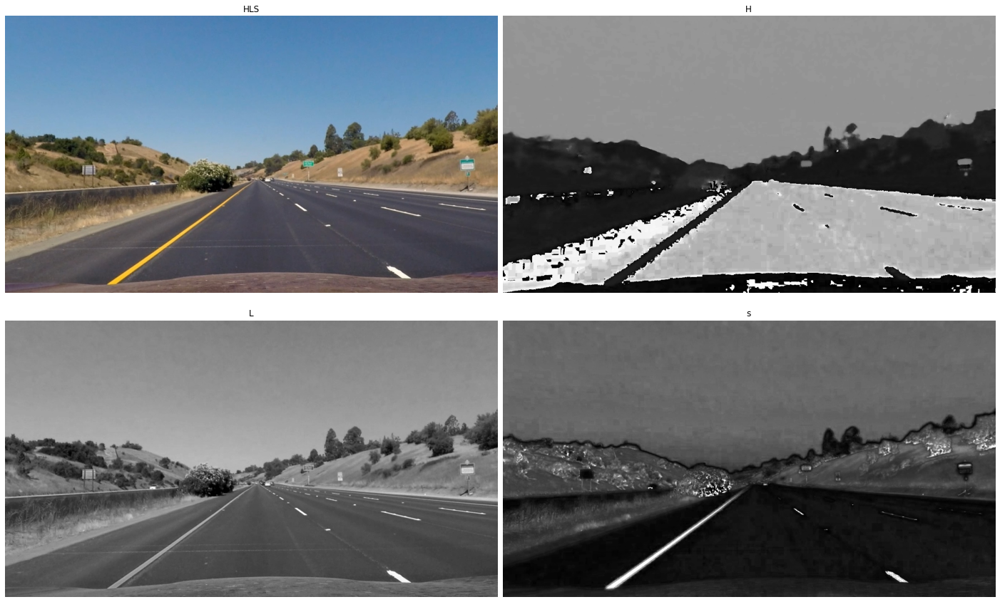

In [41]:
img_hls = bgr2hls(img_undist)
h = img_hls[:,:,0]
l = img_hls[:,:,1]
s = img_hls[:,:,2]
fig, axs = plt.subplots(2, 2, figsize=(25,15))
axs[0,0].set_title('HLS')
axs[0,0].imshow(img_rgb)
axs[0,1].set_title('H')
axs[0,1].imshow(h, cmap='gray')
axs[1,0].set_title('L')
axs[1,0].imshow(l, cmap='gray')
axs[1,1].set_title('s')
axs[1,1].imshow(s, cmap='gray')
plt.subplots_adjust(wspace = 0, hspace = 0.1)
for axis in axs.flat:
    axis.axis('off')

We can see that the S-channel in HLS color space givs a good indication of lane line location. We can also see that the *inverse* of the H-channel gives a good indication of lane line position but also includes other information.

The next step is to apply thresholds to the R, S and H channels to produce a binary mask that acts as a color threshold.

In [42]:
class ImageMask:
    def __init__(self, img): 
        self.img = img
        self.thresh = (50,200)      
        self.output = widgets.Output(layout = {
            'width': '100%',
            'height': '550px',
        })
        style = {'description_width': '90px'}
        layout = widgets.Layout(width = '100%', height = '100%')
        self.thresh_tb = widgets.IntRangeSlider(min=0, max=255, value=self.thresh,
                        description='Threshold range', style=style, layout=layout)       
        self.thresh_tb.observe(self.eventhandler, 'value')        
        display(self.thresh_tb)
        self.render()
        plt.close("all")
        
    def eventhandler(self, change):
        
        self.thresh = change.new
        self.render()
        
    def render(self):
        self.mask = cv2.inRange(self.img, self.thresh[0], self.thresh[1])
        with self.output:
            self.output.clear_output(wait=True)
            fig, ax = plt.subplots(figsize = (12.8*1.2, 9.6*1.2));
            ax.axis('off')
            plt.title('Binary Mask')
            ax.imshow(self.mask, cmap='gray')
            display(fig)


In [21]:
r_binary = ImageMask(r)
display(r_binary.output)

IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

In [22]:
s_binary = ImageMask(s)
display(s_binary.output)

IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

In [23]:
h_binary = ImageMask(h)
display(h_binary.output)

IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

R binary: 210 - 255

S binary: 135 -255

H binary: 0 - 35

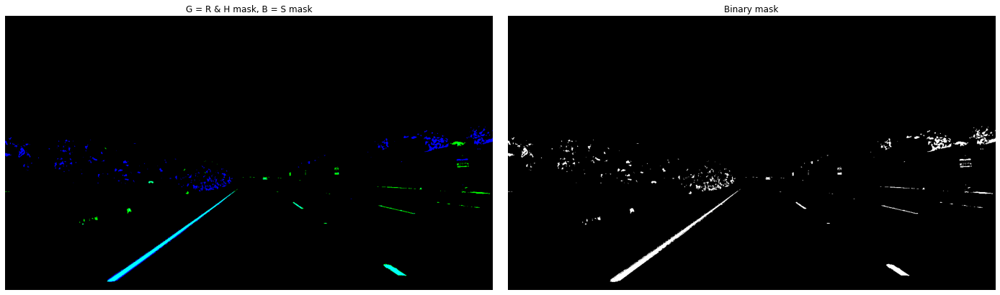

In [43]:
color_thresh = (r_binary.mask & h_binary.mask) | s_binary.mask
image_colorbinary = np.dstack((np.zeros_like(r_binary.mask), (r_binary.mask & h_binary.mask), s_binary.mask))
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (25,7))
ax1.set_title('G = R & H mask, B = S mask')
ax1.axis('Off')
ax1.imshow(image_colorbinary)
ax2.set_title('Binary mask')
ax2.axis('Off')
ax2.imshow(color_thresh, cmap='gray');
plt.subplots_adjust(wspace = 0)

Finally, we combine the gradient and color thresholds mask to form the final Threshold Image

---

### Threshold Image

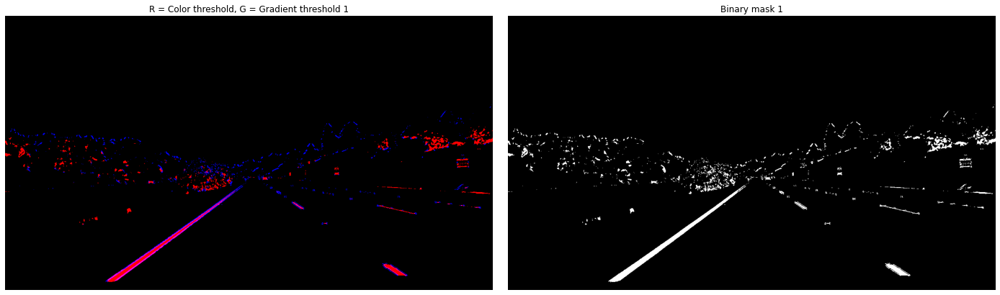

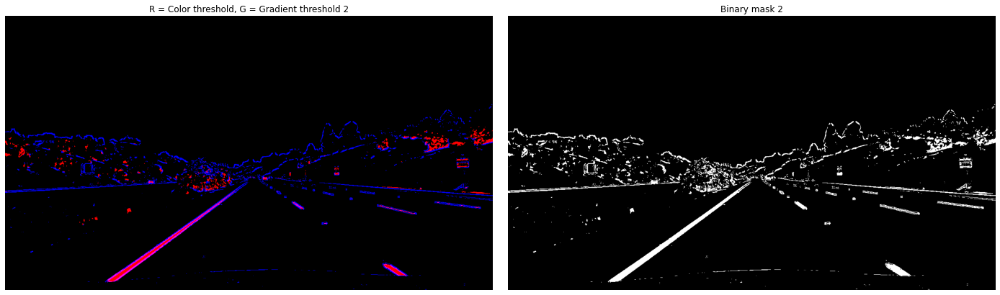

In [44]:
threshold_image_1 = color_thresh | grad_thresh_1
color_binary_1 = np.dstack((color_thresh, np.zeros_like(color_thresh), grad_thresh_1))
threshold_image_2 = color_thresh | grad_thresh_2
color_binary_2 = np.dstack((color_thresh, np.zeros_like(color_thresh), grad_thresh_2))

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,7))
ax1.set_title('R = Color threshold, G = Gradient threshold 1')
ax1.axis('Off')
ax1.imshow(color_binary_1)
ax2.set_title('Binary mask 1')
ax2.axis('Off')
ax2.imshow(threshold_image_1, cmap='gray')
plt.subplots_adjust(wspace = 0)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,7))
ax1.set_title('R = Color threshold, G = Gradient threshold 2')
ax1.axis('Off')
ax1.imshow(color_binary_2)
ax2.set_title('Binary mask 2')
ax2.axis('Off')
ax2.imshow(threshold_image_2, cmap='gray')
plt.subplots_adjust(wspace = 0)

Subjectively it appears that the first gradient threshold image, (X & Y) | (MAG & DIR), results in the best lane line finding and so will be used moving forward

In [45]:
threshold_image = threshold_image_1.copy()


---

## Warp Perspective

In this stage of the pipeline we warp the perspective to get a 'birds-eye' view of the road ahead.

The perspective transform matrix, M, is found using the code below, where src 
`M = cv2.getPerspectiveTransform(src, dst)`

`cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)`

Just set angle?

Define warp source points, assume camera is centrally mounted on vehicle and perspective remains constant for all images

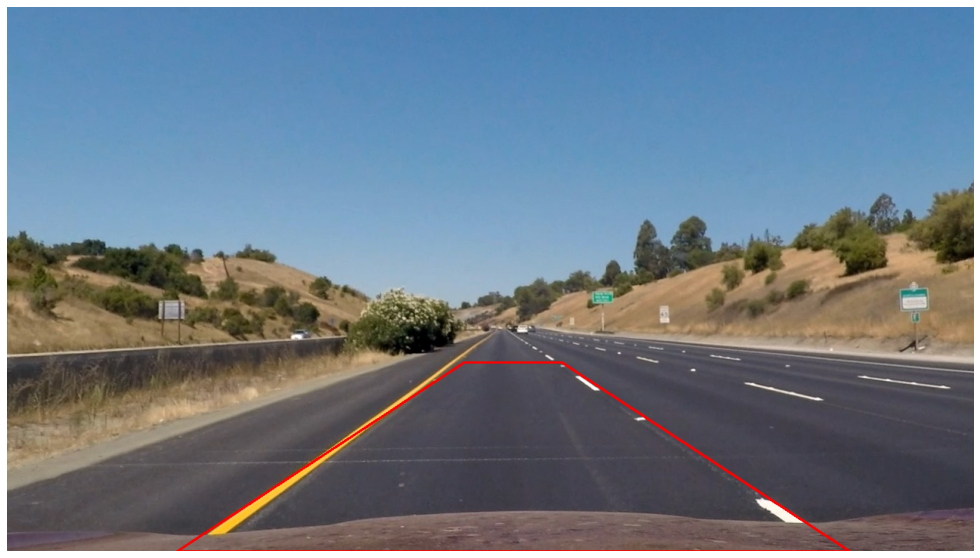

In [27]:
# THIS DIDN'T WORK VERY WELL AS THE ASSUMPTIONS ABOVE ARE WRONG...
poly_alpha = np.pi/5.4
poly_x = 445
poly_y = 250
offset = 30
base = poly_y / np.tan(poly_alpha)
p1 = (img_undist.shape[1] / 2 - poly_x + offset, img_undist.shape[0])
p2 = (img_undist.shape[1]/2 - (poly_x - base) + offset, img_undist.shape[0] - poly_y)
p3 = (img_undist.shape[1]/2 + (poly_x - base) + offset, img_undist.shape[0] - poly_y)
p4 = (img_undist.shape[1] / 2 + poly_x + offset, img_undist.shape[0])
pts = np.array([p1, p2, p3, p4], dtype = np.int32)
img_src = cv2.polylines(img_undist.copy(), [pts], True, (0,0,255), 2)
plt.figure(figsize=(20,10))
plt.axis('Off')
plt.imshow(bgr2rgb(img_src));

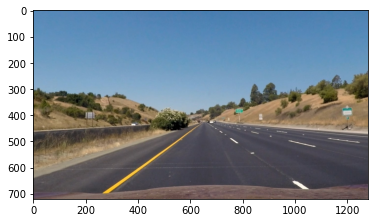

In [28]:
%matplotlib osx
plt.imshow(bgr2rgb(img_undist));

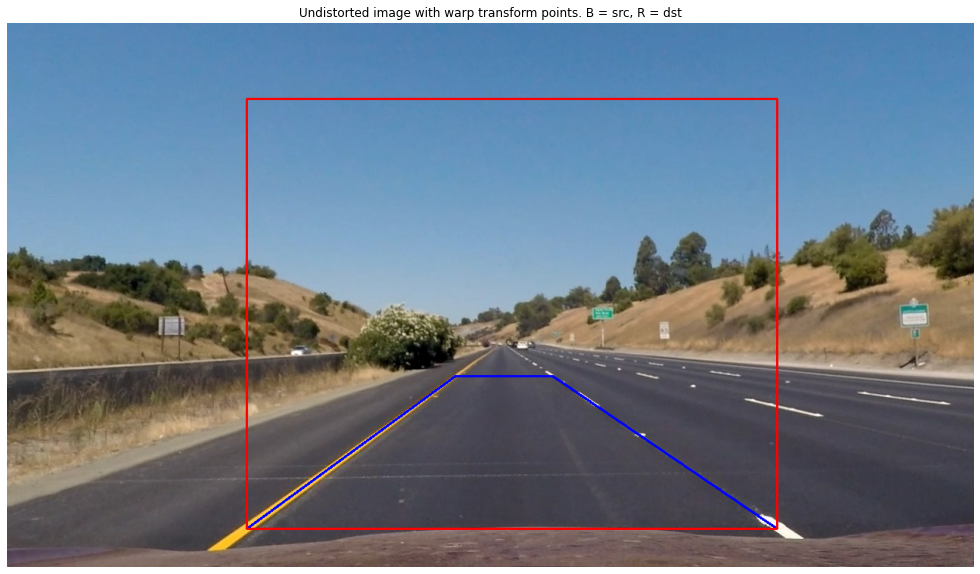

In [492]:
%matplotlib inline
p1 = (593, 467)
p2 = (722, 467)
p3 = (1019, 669)
p4 = (317, 669)
src = np.array([p1, p2, p3, p4], dtype = np.int32)
dst = np.array([[317,100],[1019,100],p3,p4], dtype=np.int32)
img_warp_pts = cv2.polylines(img_undist.copy(), [src], True, (255,0,0), 2)
cv2.polylines(img_warp_pts, [dst], True, (0,0,255), 2)
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.title('Undistorted image with warp transform points. B = src, R = dst')
plt.imshow(bgr2rgb(img_warp_pts));

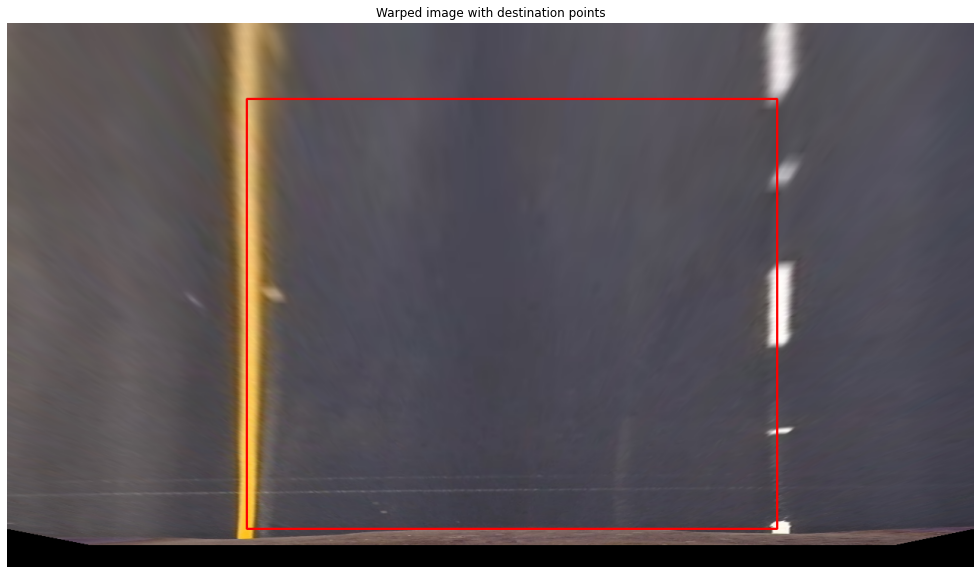

In [525]:
img_size = (img_undist.shape[1], img_undist.shape[0])
M = cv2.getPerspectiveTransform(np.float32(src), np.float32(dst))
Minv = cv2.getPerspectiveTransform(np.float32(dst), np.float32(src))
img_warped = cv2.warpPerspective(img_undist, M, img_size, flags=cv2.INTER_LINEAR)
cv2.polylines(img_warped, [dst], True, (0,0,255), 2);
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.title('Warped image with destination points')
plt.imshow(bgr2rgb(img_warped));

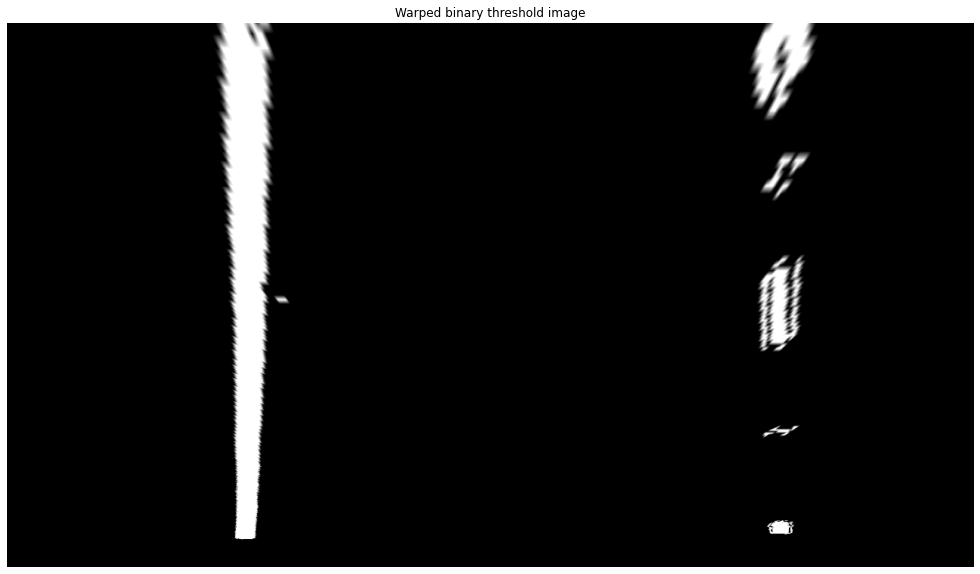

In [494]:
img_thresh_warp = cv2.warpPerspective(threshold_image, M, img_size, flags=cv2.INTER_LINEAR)
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.title('Warped binary threshold image')
plt.imshow(bgr2rgb(img_thresh_warp));

---
## Identify Lane Pixels

Two methods are used to identify pixels that correspond to lane lines, and to subsequently fit lane lines.
 - Sliding window
 - Search from prior
 
The sliding window doesn't need any information from previous frames and so is so more robust, but more computationally expensive. So we use the sliding window to get started but then use the search from prior method once we have found a lane line

---
### Histogram Peaks

We use a histogram method to identify where the lane lines start nearest to the camera. This method counts all the non-zero pixels at each point in x. The locations where the most non-zero pixels occur are likely to be lane lines. We only look at the bottom half of the image as the lane lines are most likely to be straight and not distorted by the transformation.

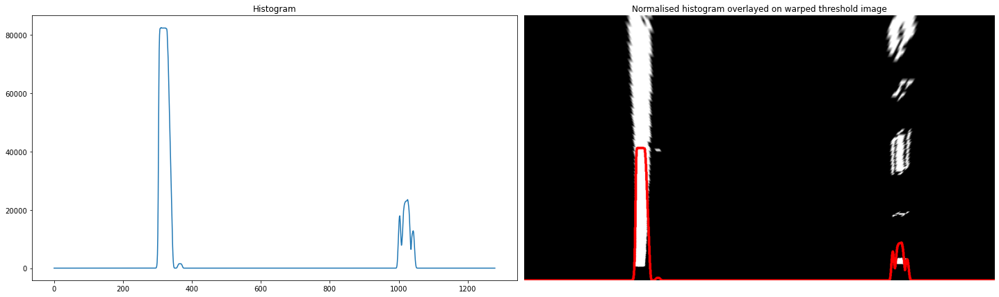

In [495]:
img_hist = img_thresh_warp[img_thresh_warp.shape[0]//2:,:]
hist_y = np.sum(img_hist, 0)
hist_x = np.arange(0, img_hist.shape[1], 1)

# normalise hist_y for plotting purposes
hist_y_norm = img_hist.shape[0] * hist_y / np.max(hist_y)
hist_y_norm = np.absolute(hist_y_norm - img_thresh_warp.shape[0])
hist_pts = np.dstack([hist_x, hist_y_norm])
hist_pts = np.int32(hist_pts)
img_hist = img_thresh_warp.copy()
img_hist = gray2bgr(img_hist)
cv2.polylines(img_hist, [hist_pts], False, (0,0,255), 5)

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (25, 7))
ax1.set_title('Histogram')
ax1.plot(hist_pts)
ax2.set_title('Normalised histogram overlayed on warped threshold image')
ax2.axis('Off')
ax2.imshow(bgr2rgb(img_hist));
plt.subplots_adjust(wspace=0)

### Find the peaks


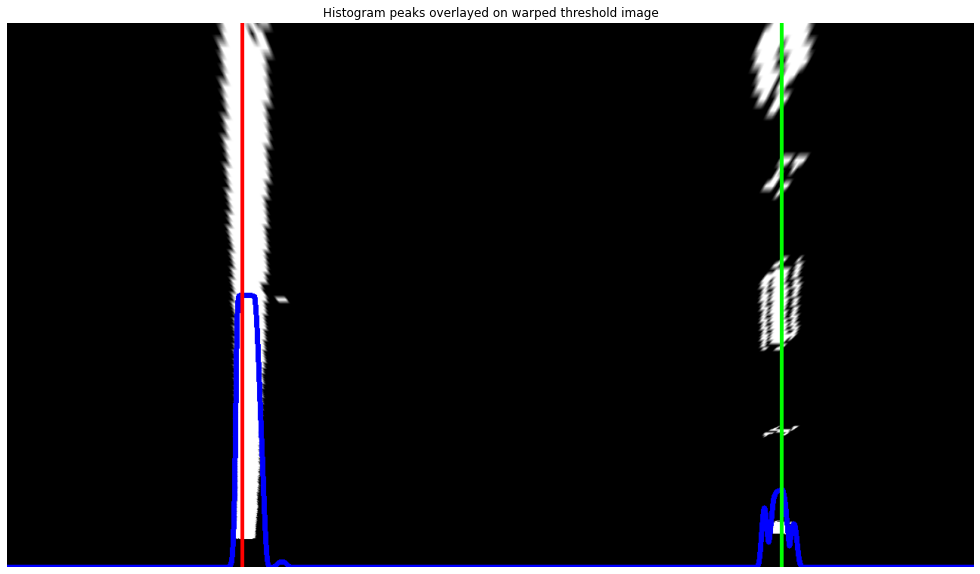

In [496]:
mid_x = len(hist_y) // 2
leftpeak_x = np.argmax(hist_y[:mid_x])
rightpeak_x = np.argmax(hist_y[mid_x:]) + mid_x
img_peaks = img_hist.copy()

cv2.line(img_peaks, (leftpeak_x,0), (leftpeak_x, img_peaks.shape[0]), (255,0, 0), 3)
cv2.line(img_peaks, (rightpeak_x,0), (rightpeak_x, img_peaks.shape[0]), (0,255, 0), 3)
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.title('Histogram peaks overlayed on warped threshold image')
plt.imshow(img_peaks);

Experiment with drawing windows on image and finding non-zero pixels inside the window

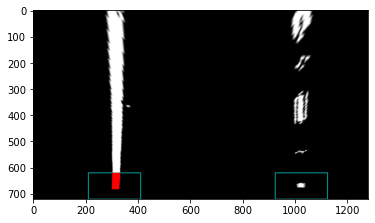

In [497]:
w_width = 200
w_height = 100
img_window = gray2bgr(img_thresh_warp.copy())
p1_l = (leftpeak_x - w_width//2, img_window.shape[0])
p2_l = (leftpeak_x + w_width//2, img_window.shape[0] - w_height)
p1_r = (rightpeak_x - w_width//2, img_window.shape[0])
p2_r = (rightpeak_x + w_width//2, img_window.shape[0] - w_height)
cv2.rectangle(img_window, p1_l, p2_l, (200,200,0),2)
cv2.rectangle(img_window, p1_r, p2_r, (200,200,0),2)
plt.imshow(bgr2rgb(img_window));

# Find indices of non-zero pixels
top_left = np.array([img_window.shape[0] - w_height, leftpeak_x - w_width//2])
window = np.array(img_thresh_warp[top_left[0]:top_left[0]+w_height, top_left[1]:top_left[1]+w_width])
window_inds = np.transpose(window.nonzero())
img_inds = np.add(window_inds, top_left)
img_window[img_inds[:,0],img_inds[:,1]] = (0,0,255)
plt.imshow(bgr2rgb(img_window));


Create a Window class that allows us to iterate through image and identify all pixels that may correspond to lane lines

In [498]:
class Window:
    def __init__(self, img, centre_x, base_y, width, height, minpix):
        self.img = img
        self.dst = dst
        self.p1 = (max(0,centre_x - width//2), max(0,base_y - height))
        self.p2 = (centre_x + width//2, base_y - height)
        self.p3 = (min(img.shape[1], centre_x + width//2), base_y)
        self.p4 = (centre_x - width//2, base_y)
        self.pts = np.array([p1,p2,p3,p4], dtype=np.int32)
        self.window = np.array(img[self.p1[1]:self.p3[1], self.p1[0]:self.p3[0],0])
        self.minpix = minpix
        
    def draw_window(self, img, color = (200,200,0)):
        cv2.rectangle(img, self.p1, self.p3, color, 2)
        
    def get_pixels(self):
        window = self.window
        # window_inds gives positions of nonzero pixels in window frame of reference
        # img_inds gives positions of nonzero pixels in image frame of reference
        window_inds = np.transpose(window.nonzero())
        # Need to swap window_inds columns around as openCV has coordinates as (x,y) but pixels as (row, column)...
        window_inds[:,[1,0]] = window_inds[:,[0,1]]
        self.img_inds = np.add(window_inds, self.p1)
        
        return self.img_inds
    
    def draw_pixels(self, img, color = (0,0,255)):
        img_inds = self.img_inds
        img[img_inds[:,1], img_inds[:,0]] = color        
        
    def get_next_centrex(self):
        if len(self.img_inds) >= self.minpix:
            new_centre_x = np.int(np.mean(self.img_inds[:,0]))
            return new_centre_x

Iterate through image to identify non-zero pixels.

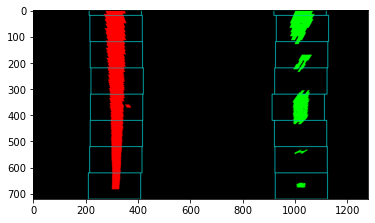

In [522]:
img_sliding_window = gray2bgr(img_thresh_warp.copy())
img_output = np.zeros_like(img_sliding_window)
img_height = img_sliding_window.shape[0]
img_width = img_sliding_window.shape[1]
lane_pts = [[],[]]
lane_colors = ((0,0,255),(0,255,0))
lanestart_x = (leftpeak_x, rightpeak_x)
minpix = 50

for lane in range(2):
    centre_x = lanestart_x[lane]
    base_y = img_height
    for win in range(img_height // w_height + (img_height % w_height > 0)):
        window = Window(img_sliding_window, centre_x, base_y, w_width, w_height, minpix)
        window.draw_window(img_output)
        img_inds = window.get_pixels()
        lane_pts[lane].append(img_inds)
        window.draw_pixels(img_output, lane_colors[lane])
        centre_x = window.get_next_centrex()
        base_y -= w_height
        
left_lane_pts = np.concatenate(lane_pts[0])
right_lane_pts = np.concatenate(lane_pts[1])
plt.imshow(bgr2rgb(img_output));
mask = np.zeros_like(img_sliding_window)
mask[left_lane_pts[:,1], left_lane_pts[:,0]] = (255,0,0)
mask[right_lane_pts[:,1], right_lane_pts[:,0]] = (0,255,0)

Find and plot best fit lines for left and right lane pixels

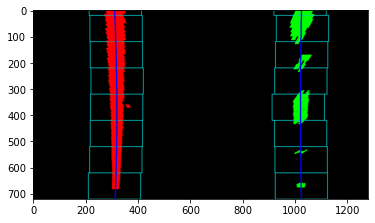

In [590]:
left_fit = np.polyfit(left_lane_pts[:,1], left_lane_pts[:,0], 2)
right_fit = np.polyfit(right_lane_pts[:,1], right_lane_pts[:,0], 2)

plot_y = np.linspace(0, img_thresh_warp.shape[0]-1, img_thresh_warp.shape[0])
left_x = np.polyval(left_fit, plot_y)
right_x = np.polyval(right_fit, plot_y)
left_pts = np.transpose(np.vstack((left_x, plot_y)))
right_pts = np.transpose(np.vstack((right_x, plot_y)))
cv2.polylines(img_output, np.int32([left_pts]), False, (255,0,0), 4)
cv2.polylines(img_output, np.int32([right_pts]), False, (255,0,0), 4)
plt.imshow(bgr2rgb(img_output));

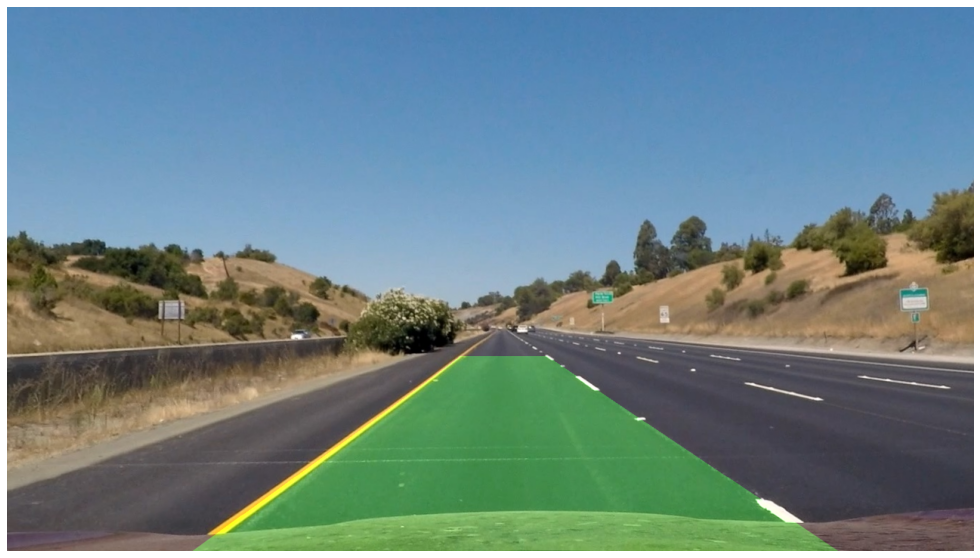

In [599]:
# Create an image to draw the lane guide on
canvas = gray2bgr(np.zeros_like(img_thresh_warp))

pts = np.vstack((left_pts, right_pts[::-1]))
cv2.fillPoly(canvas, np.int32([pts]), (0,255, 0))

# Use inverse perspective matrix (Minv) to warp canvas back to original image space
lane_warp = cv2.warpPerspective(canvas, Minv, (img_bgr.shape[1], img_bgr.shape[0])) 
result = cv2.addWeighted(img_undist, 1, lane_warp, 0.3, 0)
plt.figure(figsize=(20,10))
plt.axis('Off')
plt.imshow(bgr2rgb(result));

In [607]:
class Line:
    def __init__(self, px):
        self.px = px
        self.coeffs = np.polyfit(self.px[:,1], self.px[:,0], 2)
        self.curv = self.find_curvature(0, 3.7/700, 30/720)

    def find_curvature(self, y, mx, my):
        A = mx/(my**2) * self.coeffs[0]
        B = mx/my * self.coeffs[1]
        C = self.coeffs[2]
        curv = (1+(2*A*y + B)**2)**(3/2) / (2*A)
        
        return curv

In [609]:
leftlane = Line(left_lane_pts)
rightlane = Line(right_lane_pts)
print(leftlane.curv)
print(rightlane.curv)

-2828.0042009039043
6470.13199872135


## Full Pipeline
We run the full pipeline on a new test image

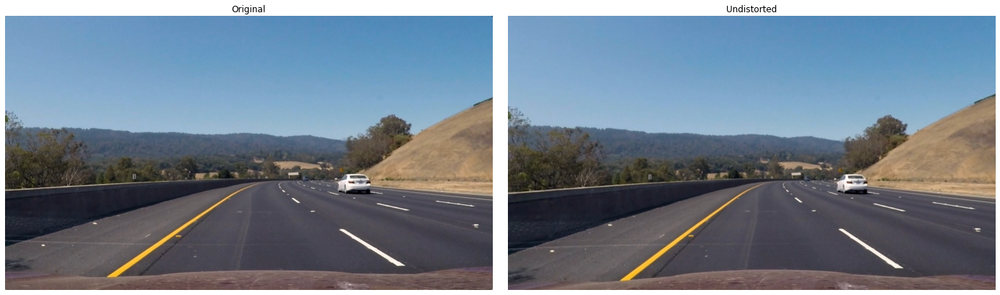

In [659]:
path = 'test_images'
fn = 'test3.jpg'
img_bgr = cv2.imread(os.path.join(path, fn))

img_undist = cv2.undistort(img_bgr, mtx, dist, None, newCameraMtx)

img_undist_gray = bgr2gray(img_undist)


plt.figure(figsize = (25,7))
plt.subplot(121)
plt.title('Original')
plt.axis('Off')
plt.imshow(bgr2rgb(img_bgr));
plt.subplot(122)
plt.title('Undistorted')
plt.axis('Off')
plt.subplots_adjust(wspace = 0)
plt.imshow(bgr2rgb(img_undist));

IntSlider(value=7, description='Kernel size', layout=Layout(height='100%', width='100%'), max=21, min=1, step=…

IntSlider(value=50, description='Low threshold', layout=Layout(height='100%', width='100%'), max=255, style=Sl…

IntSlider(value=180, description='High threshold', layout=Layout(height='100%', width='100%'), max=255, style=…

IntSlider(value=7, description='Kernel size', layout=Layout(height='100%', width='100%'), max=21, min=1, step=…

IntSlider(value=40, description='Low threshold', layout=Layout(height='100%', width='100%'), max=255, style=Sl…

IntSlider(value=180, description='High threshold', layout=Layout(height='100%', width='100%'), max=255, style=…

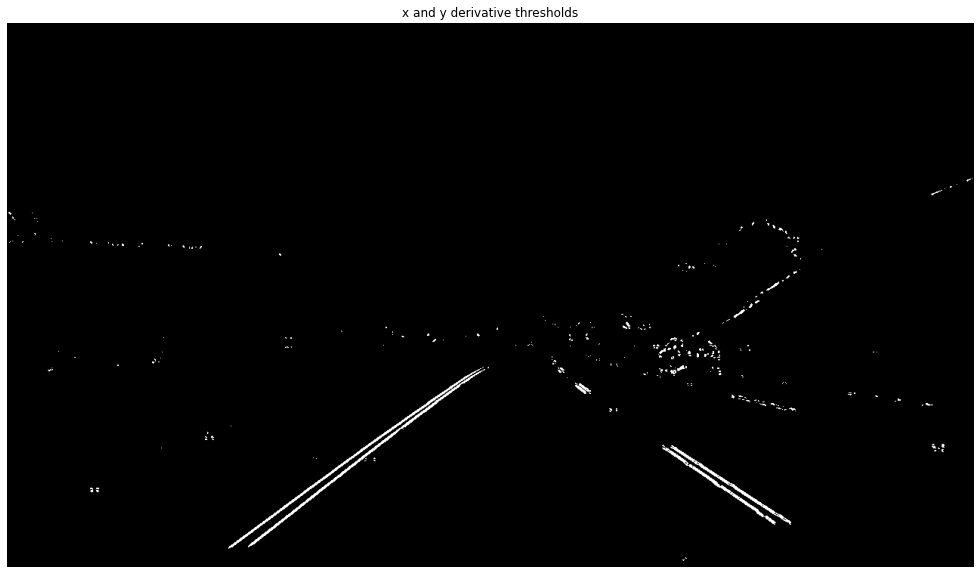

In [660]:
sobelx_mask = GradientThreshold(img_undist_gray, 7, (50,180), 'x')
sobely_mask = GradientThreshold(img_undist_gray, 7, (40, 180), 'y')
sobelxandy_mask = sobelx_mask.sobel & sobely_mask.sobel
plt.figure(figsize=(20,10))
plt.title('x and y derivative thresholds')
plt.axis('off')
plt.imshow(sobelxandy_mask, cmap='gray');

In [661]:
k_size = 7
thresh = (80, 180)
sobel_mag_mask = sobel_mag_thresh(img_undist_gray, k_size, thresh)


In [662]:
k_size = 23
thresh = (0.7, 1.2)
sobel_dir_mask = sobel_dir_thresh(img_undist_gray, k_size, thresh)


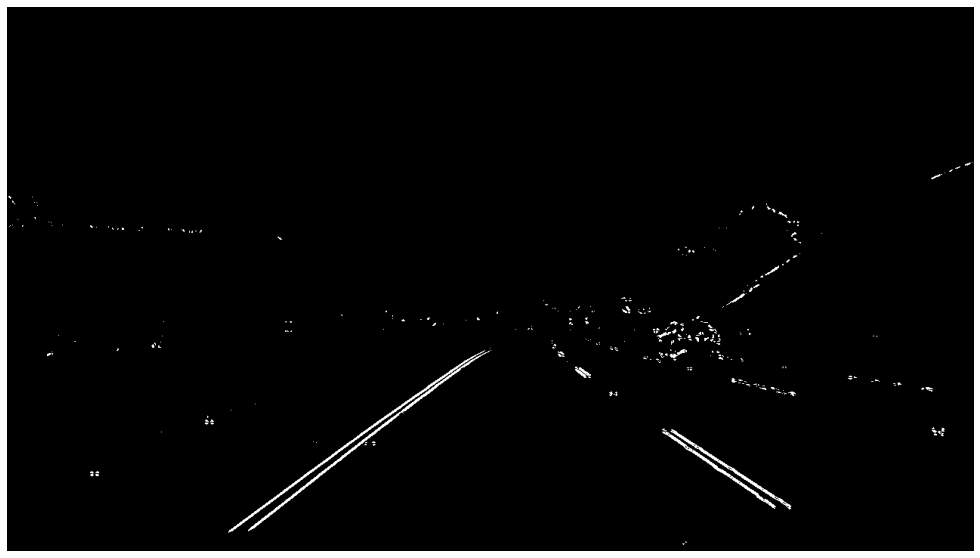

In [663]:
grad_thresh = (sobelx_mask.sobel & sobely_mask.sobel) | (sobel_mag_mask & sobel_dir_mask)
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.imshow(grad_thresh, cmap='gray');

In [622]:
img_rgb = bgr2rgb(img_undist)
img_hls = bgr2hls(img_undist)
r = img_rgb[:,:,0]
h = img_hls[:,:,0]
s = img_hls[:,:,2]

In [628]:
r_binary = ImageMask(r)
display(r_binary.output)


IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

In [629]:
h_binary = ImageMask(h)
display(h_binary.output)

IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

In [630]:
s_binary = ImageMask(s)
display(s_binary.output)

IntRangeSlider(value=(50, 200), description='Threshold range', layout=Layout(height='100%', width='100%'), max…

Output(layout=Layout(height='550px', width='100%'))

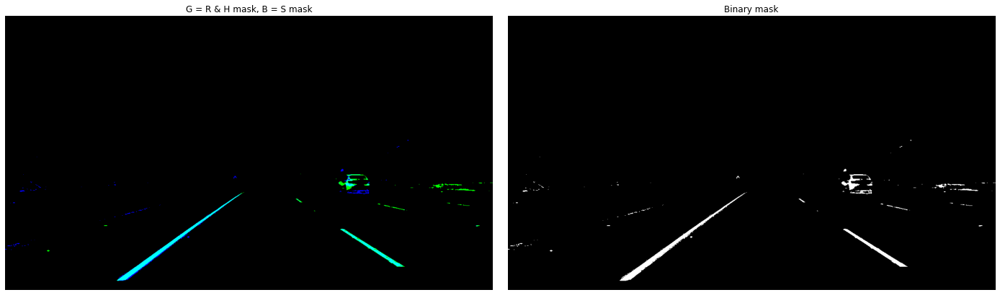

In [631]:
color_thresh = (r_binary.mask & h_binary.mask) | s_binary.mask
image_colorbinary = np.dstack((np.zeros_like(r_binary.mask), (r_binary.mask & h_binary.mask), s_binary.mask))
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (25,7))
ax1.set_title('G = R & H mask, B = S mask')
ax1.axis('Off')
ax1.imshow(image_colorbinary)
ax2.set_title('Binary mask')
ax2.axis('Off')
ax2.imshow(color_thresh, cmap='gray');
plt.subplots_adjust(wspace = 0)

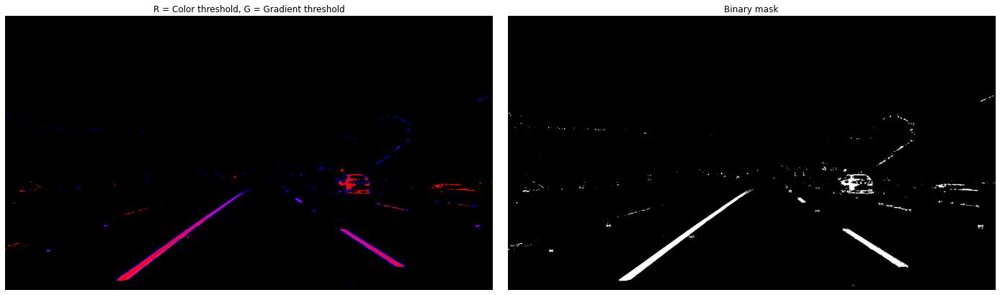

In [638]:
threshold_image = color_thresh | grad_thresh
color_binary = np.dstack((color_thresh, np.zeros_like(color_thresh), grad_thresh))

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,7))
ax1.set_title('R = Color threshold, G = Gradient threshold')
ax1.axis('Off')
ax1.imshow(color_binary)
ax2.set_title('Binary mask')
ax2.axis('Off')
ax2.imshow(threshold_image, cmap='gray')
plt.subplots_adjust(wspace = 0)

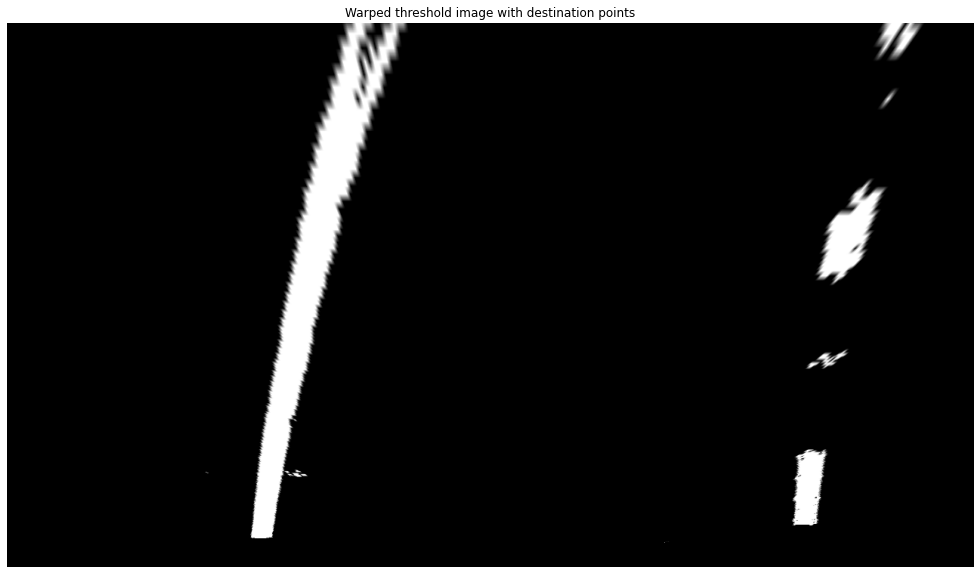

In [640]:
img_thresh_warp = cv2.warpPerspective(threshold_image, M, img_size, flags=cv2.INTER_LINEAR)
plt.figure(figsize = (20,10))
plt.axis('Off')
plt.title('Warped threshold image with destination points')
plt.imshow(bgr2rgb(img_thresh_warp));

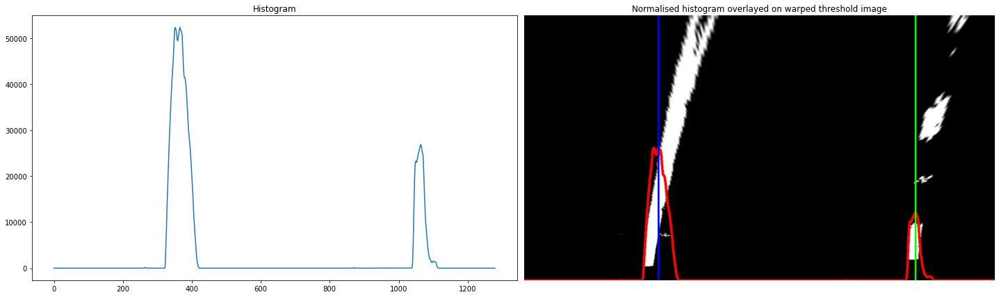

In [646]:
img_hist = img_thresh_warp[img_thresh_warp.shape[0]//2:,:]
hist_y = np.sum(img_hist, 0)
hist_x = np.arange(0, img_hist.shape[1], 1)

# normalise hist_y for plotting purposes
hist_y_norm = img_hist.shape[0] * hist_y / np.max(hist_y)
hist_y_norm = np.absolute(hist_y_norm - img_thresh_warp.shape[0])
hist_pts = np.dstack([hist_x, hist_y_norm])
hist_pts = np.int32(hist_pts)

mid_x = len(hist_y) // 2
leftpeak_x = np.argmax(hist_y[:mid_x])
rightpeak_x = np.argmax(hist_y[mid_x:]) + mid_x

img_hist = img_thresh_warp.copy()
img_hist = gray2bgr(img_hist)
cv2.polylines(img_hist, [hist_pts], False, (0,0,255), 5)

cv2.line(img_hist, (leftpeak_x,0), (leftpeak_x, img_peaks.shape[0]), (255,0, 0), 3)
cv2.line(img_hist, (rightpeak_x,0), (rightpeak_x, img_peaks.shape[0]), (0,255, 0), 3)

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (25, 7))
ax1.set_title('Histogram')
ax1.plot(hist_y)
ax2.set_title('Normalised histogram overlayed on warped threshold image')
ax2.axis('Off')
ax2.imshow(bgr2rgb(img_hist));
plt.subplots_adjust(wspace=0)
mid_x = len(hist_y) // 2

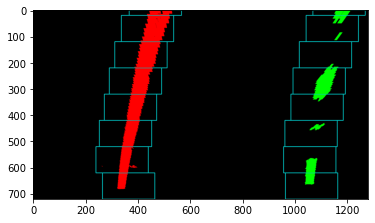

In [647]:
img_sliding_window = gray2bgr(img_thresh_warp.copy())
img_output = np.zeros_like(img_sliding_window)
img_height = img_sliding_window.shape[0]
img_width = img_sliding_window.shape[1]
lane_pts = [[],[]]
lane_colors = ((0,0,255),(0,255,0))
lanestart_x = (leftpeak_x, rightpeak_x)
minpix = 50

for lane in range(2):
    centre_x = lanestart_x[lane]
    base_y = img_height
    for win in range(img_height // w_height + (img_height % w_height > 0)):
        window = Window(img_sliding_window, centre_x, base_y, w_width, w_height, minpix)
        window.draw_window(img_output)
        img_inds = window.get_pixels()
        lane_pts[lane].append(img_inds)
        window.draw_pixels(img_output, lane_colors[lane])
        centre_x = window.get_next_centrex()
        base_y -= w_height
        
left_lane_pts = np.concatenate(lane_pts[0])
right_lane_pts = np.concatenate(lane_pts[1])
plt.imshow(bgr2rgb(img_output));
mask = np.zeros_like(img_sliding_window)
mask[left_lane_pts[:,1], left_lane_pts[:,0]] = (255,0,0)
mask[right_lane_pts[:,1], right_lane_pts[:,0]] = (0,255,0)

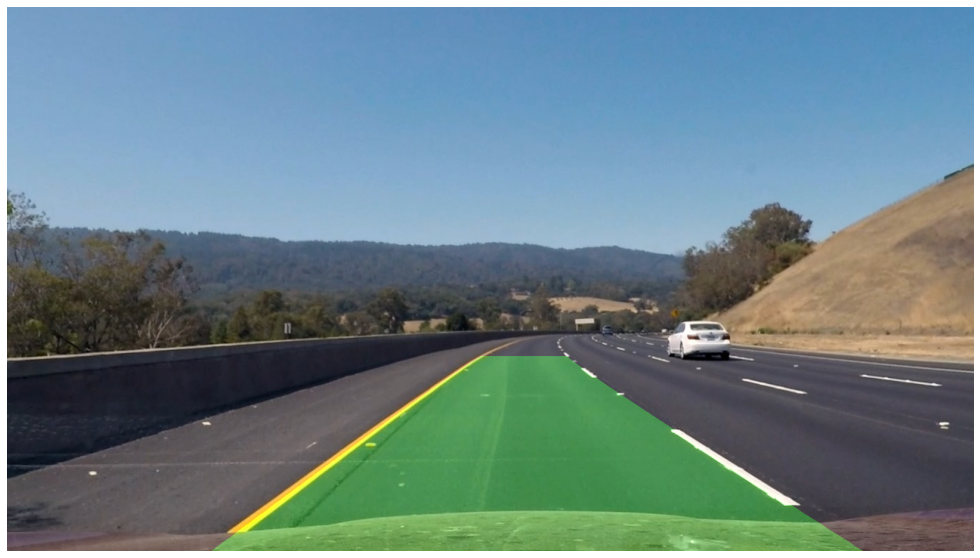

In [651]:
leftlane = Line(left_lane_pts)
rightlane = Line(right_lane_pts)

plot_y = np.linspace(0, img_thresh_warp.shape[0]-1, img_thresh_warp.shape[0])
left_x = np.polyval(leftlane.coeffs, plot_y)
right_x = np.polyval(rightlane.coeffs, plot_y)
left_pts = np.transpose(np.vstack((left_x, plot_y)))
right_pts = np.transpose(np.vstack((right_x, plot_y)))

# Create an image to draw the lane guide on
canvas = gray2bgr(np.zeros_like(img_thresh_warp))

pts = np.vstack((left_pts, right_pts[::-1]))
cv2.fillPoly(canvas, np.int32([pts]), (0,255, 0))

# Use inverse perspective matrix (Minv) to warp canvas back to original image space
lane_warp = cv2.warpPerspective(canvas, Minv, (img_bgr.shape[1], img_bgr.shape[0])) 
result = cv2.addWeighted(img_undist, 1, lane_warp, 0.3, 0)
plt.figure(figsize=(20,10))
plt.axis('Off')
plt.imshow(bgr2rgb(result));

# TO DO
- Line class
- Curvature and lane position
- Check other images
- Find pixels from prior (not sliding window)
- Video